In [188]:
# importing useful libraries 
import pandas as pd 
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt 
import re


%matplotlib inline 

census = pd.read_csv(r'C:\Users\Laptop\Downloads\census.csv')

census

census.sample(20)

census.columns

census.info()

In [194]:
# checking for null values
census.isnull().sum()

House Number                        0
Street                              0
First Name                          0
Surname                             0
Age                                 0
Relationship to Head of House       0
Marital Status                   2557
Gender                              0
Occupation                          0
Infirmity                           0
Religion                         2620
dtype: int64

In [195]:
census.describe()

,House Number
count,10083.000000
mean,46.840920
std,53.003405
min,1.000000
25%,11.000000
50%,25.000000
75%,57.000000
max,229.000000


In [196]:
census.duplicated().sum()

0

DATA CLEANING 


In [197]:
# Replacing the NaN values in the religion and marital status column with none
census['Marital Status'] = census['Marital Status'].fillna('None')
census['Religion'] = census['Religion'].fillna('None')

In [198]:
# checking for null values in the dataset after  the above operation 
census.isnull().sum()

House Number                     0
Street                           0
First Name                       0
Surname                          0
Age                              0
Relationship to Head of House    0
Marital Status                   0
Gender                           0
Occupation                       0
Infirmity                        0
Religion                         0
dtype: int64

In [119]:
census['House Number'].value_counts()

1      384
4      255
6      240
3      240
9      236
      ... 
225      4
217      3
213      3
216      1
229      1
Name: House Number, Length: 229, dtype: int64

In [121]:
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10083 entries, 0 to 10082
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   House Number                   10083 non-null  int64 
 1   Street                         10083 non-null  object
 2   First Name                     10083 non-null  object
 3   Surname                        10083 non-null  object
 4   Age                            10083 non-null  object
 5   Relationship to Head of House  10083 non-null  object
 6   Marital Status                 10083 non-null  object
 7   Gender                         10083 non-null  object
 8   Occupation                     10083 non-null  object
 9   Infirmity                      10083 non-null  object
 10  Religion                       10083 non-null  object
dtypes: int64(1), object(10)
memory usage: 866.6+ KB


In [101]:
census.columns


Index(['House Number', 'Street', 'First Name', 'Surname', 'Age',
       'Relationship to Head of House', 'Marital Status', 'Gender',
       'Occupation', 'Infirmity', 'Religion'],
      dtype='object')

In [103]:
# Checking the number that lived in unique dwellings since it was set to 1 in the House Number column
census[census["House Number"] == 1]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian
10,1,Bletchleyrow Street,Barry,Miah,45,Head,Married,Male,Diagnostic radiographer,None,Catholic
11,1,Bletchleyrow Street,Abigail,Miah,43,Wife,Married,Female,Minerals surveyor,None,None
12,1,Bletchleyrow Street,Tina,Anderson,58,Sibling,Single,Female,Farm manager,None,Christian
13,1,Bletchleyrow Street,Bernard,Abbott,54,Lodger,Single,Male,"Pharmacist, community",None,None
...,...,...,...,...,...,...,...,...,...,...,...
10078,1,Nottingham Haven,Jodie,Bell,31,Head,Married,Female,"Geneticist, molecular",None,Methodist
10079,1,Nottingham Haven,David,Bell,30,Husband,Married,Male,"Merchandiser, retail",None,Methodist
10080,1,Nottingham Haven,Alan,Bell,1,Son,None,Male,Child,None,None
10081,1,Nottingham Haven,Graham,Hall,40,Lodger,Single,Male,Museum/gallery curator,None,Christian


In [199]:
# Cleaning the age column in the dataset
census = census[(census['Age'] !=' ') & (census['Age'] != 0)]


In [202]:
census["Age"] = census["Age"].round()

C:\Users\Laptop\AppData\Local\Temp\ipykernel_8260\1784463593.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  census["Age"] = census["Age"].round()


In [201]:
census["Age"] = census["Age"].astype("float64")

# Round off all decimal values in the "age" column to a single value



C:\Users\Laptop\AppData\Local\Temp\ipykernel_8260\1298844150.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  census["Age"] = census["Age"].astype("float64")


In [203]:
census['Age'].unique()

array([ 50.,  21.,  58.,  79.,  62.,  63.,  35.,  29.,  45.,  43.,  54.,
        44.,  52.,  17.,  16.,  14.,   8.,  23.,   1.,  24.,  38.,  40.,
        41.,   5.,   2.,  12.,   9.,  61.,  26.,  53.,  42.,  15.,  13.,
        51.,  22.,  27.,  49.,  55.,  18.,  25.,  19.,  20.,  34.,  47.,
        39.,  37.,  30.,  65.,  70.,  32.,  28.,  59.,  57.,  48.,  10.,
         0.,  71.,  31.,  11.,  36.,   4.,  46.,  60.,   3.,  56.,  69.,
        72.,  68.,  67.,  89.,  91.,  64.,  76.,  74.,  81.,  78.,  83.,
        80.,  73.,  75.,  33., 102.,  66.,   7.,   6.,  94.,  82.,  84.,
        77.,  85.,  86.,  87.,  88., 101., 104.,  98., 100., 105.,  92.,
        95., 103., 108.,  90.,  97.,  99.,  93.,  96., 111.])

In [204]:
# dropping columns where age is equal to zero
census = census[census['Age'] != 0]

In [205]:
census['Age'] = census['Age'].astype('int64')

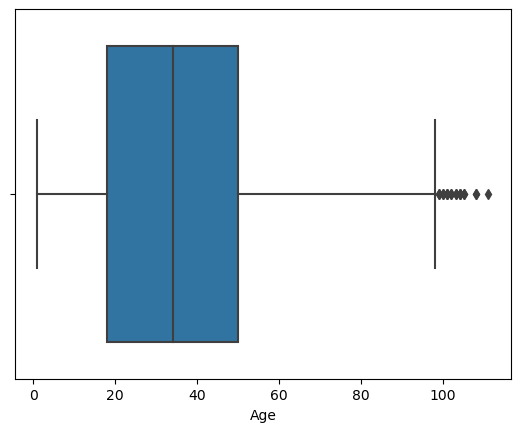

In [206]:
# Detecting the outliers using boxplot
# Create a boxplot of the age column
sb.boxplot(x=census['Age'])

# Show the plot
plt.show()

In [208]:
q1 = census["Age"].quantile(0.25)
q3 = census["Age"].quantile(0.75)
iqr = q3 - q1

# Define the lower and upper bounds for outliers using the IQR method
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Identify the outliers in the "age" column
outliers = census[(census["Age"] < lower_bound) | (census["Age"] > upper_bound)]
outliers_df = pd.DataFrame(outliers)

# Display the outliers
outliers_df.shape



(19, 11)

In [209]:
# Outliers were detected in the age column but were not removed because of the context and purpose of the analysis.

In [210]:
# Checking the marital status of the patners in the relationship to head of house column
RtoH = census[census['Relationship to Head of House'] == 'Partner']

In [211]:
census.columns

Index(['House Number', 'Street', 'First Name', 'Surname', 'Age',
       'Relationship to Head of House', 'Marital Status', 'Gender',
       'Occupation', 'Infirmity', 'Religion'],
      dtype='object')

In [212]:
census['Marital Status'].value_counts()

Single      3656
Married     2551
None        2430
Divorced     971
Widowed      346
Name: Marital Status, dtype: int64

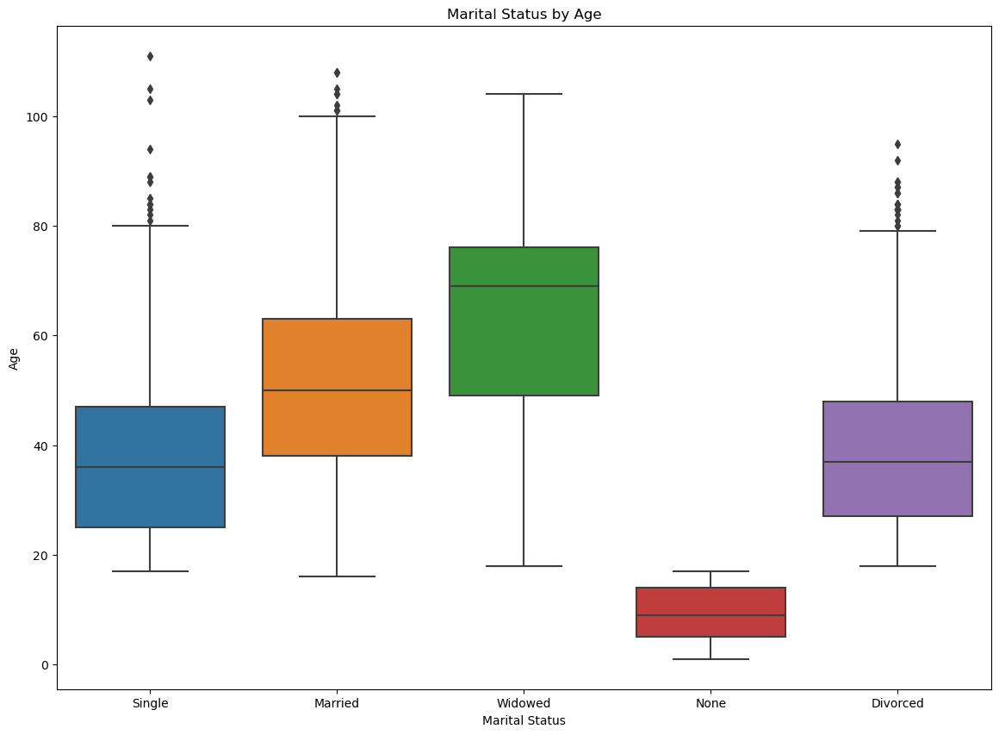

In [214]:

# Create a box plot of marital status
plt.figure(figsize=(14,10))
sb.boxplot(x='Marital Status', y='Age', data= census)
plt.title('Marital Status by Age')
plt.xlabel('Marital Status')
plt.ylabel('Age')
plt.show()


In [215]:
# Checking the outliers in the marital status column for the individuals that are windowed below 18
census[(census['Age'] < 25) & (census['Marital Status'] == 'Widowed')]


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
265,40,Andrews Avenue,Mitchell,Campbell,23,Son,Widowed,Male,Nutritional therapist,None,None
642,186,Andrews Avenue,Carole,Douglas,24,Head,Widowed,Female,Unemployed,None,None
969,2,Warren Bypass,Stewart,Reynolds,20,Head,Widowed,Male,University Student,None,Catholic
1988,8,Severn Causeway,Max,Johnson,24,Lodger,Widowed,Male,Unemployed,None,None
2294,49,Lightning Street,William,White,19,Son,Widowed,Male,University Student,None,None
2815,121,Lightning Street,Caroline,Metcalfe,18,Lodger,Widowed,Female,Student,None,None
3779,9,Grape Streets,Gareth,Roberts,20,Son,Widowed,Male,University Student,None,Christian
4029,21,Shepherd Cove,Anna,Holmes,19,Daughter,Widowed,Female,University Student,None,Catholic
4296,69,Shepherd Cove,Thomas,Lloyd,24,Son,Widowed,Male,Clinical cytogeneticist,None,Methodist
5545,36,September Street,Roger,Stewart,20,Head,Widowed,Male,Unemployed,None,None


In [216]:
# Bivariate analysis was introduced for the cleaning of the marital status column, ascertaining the validity of the enteries in the column are dependent on somw other columns 
under_18 = census[census['Age'] < 18]

# Extract the age and marital status of people under 18
age_and_marital_status = under_18[['Age', 'Marital Status']]
age_and_marital_status[age_and_marital_status['Marital Status'] == 'Married']



,Age,Marital Status
982,16,Married


In [217]:
# in the Marital status column individuals under 18 mostly had none filled in, except two who were single and one aged 16 who was married
census[(census['Marital Status'] == 'Married') & (census['Age'] < 18)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion
982,6,Warren Bypass,Sian,Walker,16,Head,Married,Female,Student,None,None


In [218]:
census.drop(census[(census['Marital Status'] == 'Married') & (census['Age'] < 18)].index,inplace = True)

In [220]:
census.shape

(9953, 11)

In [168]:
# Checking if individuals who are above 18 also filled in none in the marital status column
census[(census['Marital Status'] == 'None') & (census['Age'] > 18)]
# there wasnt any 

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion


In [221]:
census.Gender.value_counts()

Female    5206
Male      4747
Name: Gender, dtype: int64

In [222]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


In [223]:
count = census['Occupation'].value_counts(
)
count

Student                                                                2039
Unemployed                                                              660
University Student                                                      648
Child                                                                   520
PhD Student                                                              22
Customer service manager                                                 21
Health visitor                                                           17
Cabin crew                                                               16
Hydrologist                                                              16
Pathologist                                                              15
Presenter, broadcasting                                                  15
Public house manager                                                     15
Commissioning editor                                                     15
Licensed con

In [226]:
census['Infirmity'].value_counts()
# dropping the rows with empty string 
census.drop(census[census['Infirmity'] == ' '].index, inplace = True)

In [227]:
census['Infirmity'].value_counts()

None                   9867
Physical Disability      28
Deaf                     12
Unknown Infection        10
Mental Disability        10
Disabled                  8
Blind                     5
Name: Infirmity, dtype: int64

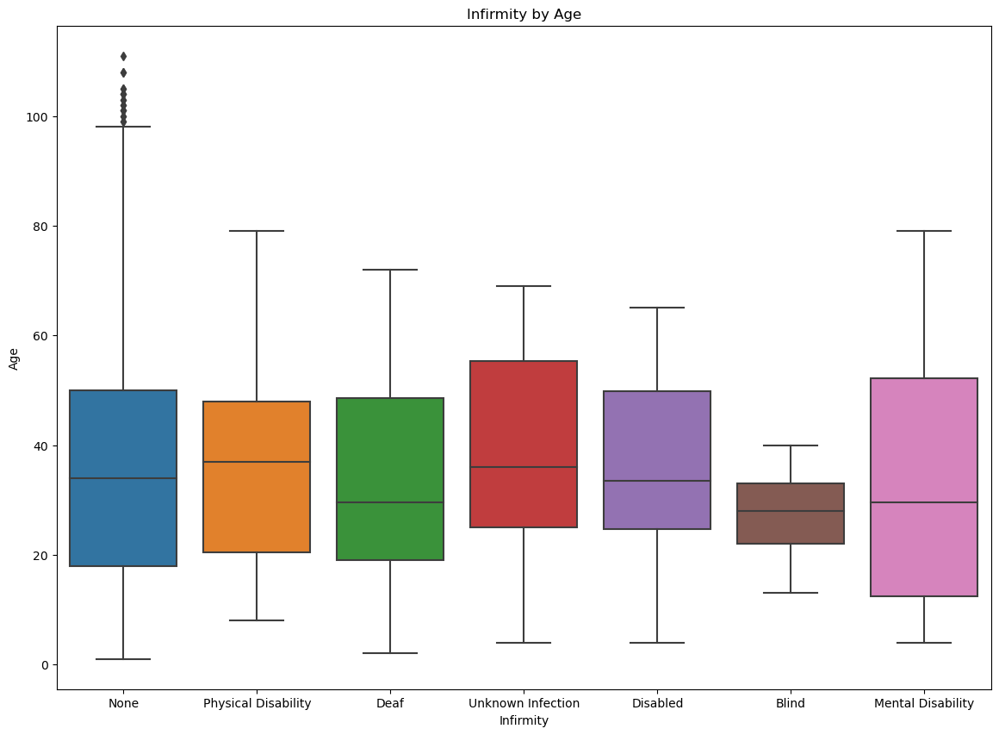

In [228]:
plt.figure(figsize=(14,10))
sb.boxplot(x='Infirmity', y='Age', data= census)
plt.title('Infirmity by Age')
plt.xlabel('Infirmity')
plt.ylabel('Age')
plt.show()


In [229]:
census['Religion'].value_counts()

None           5849
Christian      2237
Catholic       1001
Methodist       611
Muslim          129
Sikh             63
Jewish           41
Undecided         3
Bahai             1
Housekeeper       1
Orthodoxy         1
Sith              1
Nope              1
                  1
Name: Religion, dtype: int64

In [233]:
# dropping rows that contain 'Housekeeper','sith' and 'nope' in the religion column
census.drop(census[(census['Religion'] == 'Nope')| (census['Religion'] == 'Housekeeper') |(census['Religion'] == 'Sith')].index, inplace = True)

## Analysis Proper


In [234]:
census.columns

Index(['House Number', 'Street', 'First Name', 'Surname', 'Age',
       'Relationship to Head of House', 'Marital Status', 'Gender',
       'Occupation', 'Infirmity', 'Religion'],
      dtype='object')

In [236]:


# Group the data by age and gender, and count the number of records in each group
population_count = census.groupby(['Age', 'Gender']).size().reset_index(name='Count')

# Print the resulting table of population counts
population_count


,Age,Gender,Count
0,1,Female,76
1,1,Male,62
2,2,Female,70
3,2,Male,71
4,3,Female,49
5,3,Male,65
6,4,Female,60
7,4,Male,67
8,5,Female,77
9,5,Male,75


In [242]:


# Define the function to convert age to five-year age band
def age_to_band(age):
    band = age // 5 * 5
    return f"{band}-{band+4}"

# Apply the age_to_band function to the Age column and create a new column for the age bands
census['Age Band'] = census['Age'].apply(age_to_band)

# Print the first 10 rows of the data with the new age bands
census.head(10)


,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian,50-54
1,2,Gray Centers,Amber,James,21,Head,Single,Female,University Student,None,Muslim,20-24
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Professor Emeritus,None,Christian,55-59
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None,50-54
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired Retail banker,None,Christian,75-79
5,5,Gray Centers,Anna,Edwards,62,Head,Single,Female,"Civil engineer, consulting",None,Christian,60-64
6,5,Gray Centers,Terry,Holt,63,Partner,Single,Male,Careers adviser,None,Christian,60-64
7,6,Gray Centers,Stewart,Turner,50,Head,Single,Male,Press photographer,None,Catholic,50-54
8,7,Gray Centers,Glenn,Carr,35,Head,Single,Male,Bookseller,None,None,35-39
9,8,Gray Centers,Maurice,Hussain,29,Head,Single,Male,"Engineer, materials",None,Catholic,25-29


In [243]:
pop_count = census.groupby(['Gender', 'Age Band'])['House Number'].count().reset_index()


In [244]:
pop_count

,Gender,Age Band,House Number
0,Female,0-4,255
1,Female,10-14,375
2,Female,100-104,6
3,Female,105-109,2
4,Female,15-19,392
5,Female,20-24,400
6,Female,25-29,407
7,Female,30-34,389
8,Female,35-39,475
9,Female,40-44,450


In [246]:


# create a new column that combines the House Number and Street columns
census['Address'] = census['House Number'].astype(str) + ' ' + census['Street']

# create a new column called "Household ID" to identify which individuals belong to the same household
census['Household ID'] = census.groupby('Address').ngroup()

# group individuals by household ID
households = census.groupby('Household ID')

# count the number of individuals in each household
household_counts = households.size()

# create a new dataframe with the household counts
household_df = pd.DataFrame({'Household Size': household_counts})

# display the household dataframe
print(household_df)


              Household Size
Household ID                
0                          4
1                          4
2                          5
3                          3
4                          2
5                          3
6                          5
7                         12
8                          3
9                          9
10                         5
11                         1
12                         3
13                         4
14                         2
15                         4
16                         2
17                         6
18                        19
19                         4
20                         5
21                         1
22                         3
23                         2
24                         6
25                         1
26                         3
27                         4
28                         4
29                         2
30                         4
31                         5
32            

In [247]:
census

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band,Address,Household ID
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian,50-54,1 Gray Centers,40
1,2,Gray Centers,Amber,James,21,Head,Single,Female,University Student,None,Muslim,20-24,2 Gray Centers,1118
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Professor Emeritus,None,Christian,55-59,3 Gray Centers,1708
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None,50-54,3 Gray Centers,1708
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired Retail banker,None,Christian,75-79,4 Gray Centers,2140
5,5,Gray Centers,Anna,Edwards,62,Head,Single,Female,"Civil engineer, consulting",None,Christian,60-64,5 Gray Centers,2449
6,5,Gray Centers,Terry,Holt,63,Partner,Single,Male,Careers adviser,None,Christian,60-64,5 Gray Centers,2449
7,6,Gray Centers,Stewart,Turner,50,Head,Single,Male,Press photographer,None,Catholic,50-54,6 Gray Centers,2651
8,7,Gray Centers,Glenn,Carr,35,Head,Single,Male,Bookseller,None,None,35-39,7 Gray Centers,2774
9,8,Gray Centers,Maurice,Hussain,29,Head,Single,Male,"Engineer, materials",None,Catholic,25-29,8 Gray Centers,2895


In [250]:
household_counts = census.groupby('Household ID').size()

# create a new column called "Household Occupancy" using the household counts
census['Household Occupancy'] = census['Household ID'].map(household_counts)


In [251]:
census

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band,Address,Household ID,Household Occupancy
0,1,Gray Centers,Rita,Owen,50,Head,Single,Female,Media planner,None,Christian,50-54,1 Gray Centers,40,1
1,2,Gray Centers,Amber,James,21,Head,Single,Female,University Student,None,Muslim,20-24,2 Gray Centers,1118,1
2,3,Gray Centers,Oliver,Campbell,58,Head,Married,Male,Professor Emeritus,None,Christian,55-59,3 Gray Centers,1708,2
3,3,Gray Centers,Christine,Campbell,50,Wife,Married,Female,"Engineer, control and instrumentation",None,None,50-54,3 Gray Centers,1708,2
4,4,Gray Centers,Gordon,Miles,79,Head,Widowed,Male,Retired Retail banker,None,Christian,75-79,4 Gray Centers,2140,1
5,5,Gray Centers,Anna,Edwards,62,Head,Single,Female,"Civil engineer, consulting",None,Christian,60-64,5 Gray Centers,2449,2
6,5,Gray Centers,Terry,Holt,63,Partner,Single,Male,Careers adviser,None,Christian,60-64,5 Gray Centers,2449,2
7,6,Gray Centers,Stewart,Turner,50,Head,Single,Male,Press photographer,None,Catholic,50-54,6 Gray Centers,2651,1
8,7,Gray Centers,Glenn,Carr,35,Head,Single,Male,Bookseller,None,None,35-39,7 Gray Centers,2774,1
9,8,Gray Centers,Maurice,Hussain,29,Head,Single,Male,"Engineer, materials",None,Catholic,25-29,8 Gray Centers,2895,1


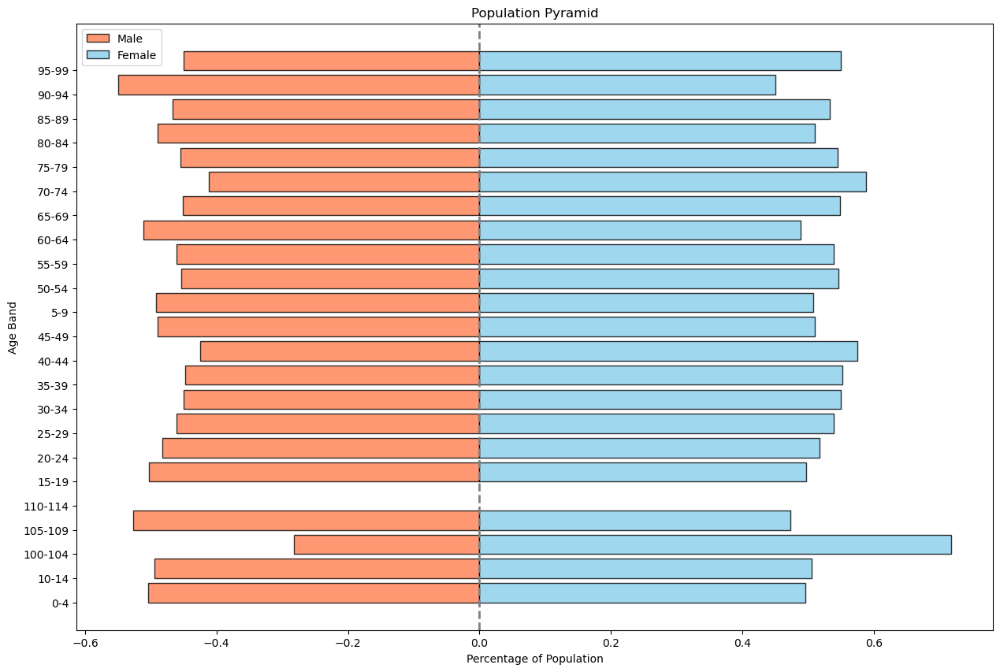

In [278]:
import pandas as pd
import matplotlib.pyplot as plt



# Calculate the total population for each age band, gender, and household
pop_count = census.groupby(['Age Band', 'Gender', 'Household ID'])['Household Occupancy'].sum().reset_index(name='Pop Count')

# Pivot the table to get male and female population counts in each age band

pop_count_pivot = pop_count.pivot_table(index='Age Band', columns='Gender', values='Pop Count', aggfunc='sum')

# Calculate the total population for each age band
pop_count_pivot['Total'] = pop_count_pivot['Female'] + pop_count_pivot['Male']

# Normalize the population counts by dividing by the total population
pop_count_pivot['Male_pct'] = pop_count_pivot['Male'] / pop_count_pivot['Total']
pop_count_pivot['Female_pct'] = pop_count_pivot['Female'] / pop_count_pivot['Total']

# Create a population pyramid plot
fig, ax = plt.subplots(figsize=(15, 10))

ax.barh(pop_count_pivot.index, -pop_count_pivot['Male_pct'], height=0.8, color='#FF7F50',align = 'edge',alpha=0.8,edgecolor = 'black', label='Male')
ax.barh(pop_count_pivot.index, pop_count_pivot['Female_pct'], height=0.8, color='#87CEEB', align = 'edge', alpha=0.8, edgecolor = 'black',label='Female')




# Add a vertical line at the zero axis
ax.axvline(x=0, color='gray', linestyle='--', linewidth=2)

# Add labels and legend
ax.set_xlabel('Percentage of Population')
ax.set_ylabel('Age Band')
ax.set_title('Population Pyramid')
ax.legend(loc='upper left')


Unemployment trends




In [296]:
def EmploymentState(text):
    if text == 'Retired':
        return 'Retired'
    
    elif text == 'University Student' or text == 'Unemployed':
        return text
    
    elif text == 'Student':
        return 'Student Child'
    
    elif len(text.split()) > 1 and text.split()[0] == 'Retired':
        return 'Retired'
    
    else:
        return 'Employed'


In [303]:
census[(census['Employment status'] == 'Unemployed') & (census['Age'] >= 65)]

,House Number,Street,First Name,Surname,Age,Relationship to Head of House,Marital Status,Gender,Occupation,Infirmity,Religion,Age Band,Address,Household ID,Household Occupancy,Employment status
93,21,Bletchleyrow Street,Carole,Barker,65,Head,Married,Female,Unemployed,None,None,65-69,21 Bletchleyrow Street,1247,6,Unemployed
473,122,Andrews Avenue,Anna,Jenkins,75,Head,Widowed,Female,Unemployed,None,Christian,75-79,122 Andrews Avenue,405,2,Unemployed
586,165,Andrews Avenue,Benjamin,Jones,78,Head,Divorced,Male,Unemployed,None,Christian,75-79,165 Andrews Avenue,827,4,Unemployed
833,3,Sydney Street,Dawn,Brown,69,Head,Divorced,Female,Unemployed,None,None,65-69,3 Sydney Street,1754,2,Unemployed
997,12,Warren Bypass,Michelle,Oliver,71,Head,Single,Female,Unemployed,None,None,70-74,12 Warren Bypass,391,5,Unemployed
1633,31,O'Brien Gateway,Jessica,Walsh,75,Wife,Married,Female,Unemployed,None,None,75-79,31 O'Brien Gateway,1829,5,Unemployed
1774,22,Roberts Divide,Adrian,Brown,65,Husband,Married,Male,Unemployed,None,None,65-69,22 Roberts Divide,1340,5,Unemployed
1883,24,ExcaliburBells Heights,Danielle,Williams,98,Head,Married,Female,Unemployed,None,Christian,95-99,24 ExcaliburBells Heights,1420,2,Unemployed
2041,9,Lightning Street,Jessica,Cross,65,Head,Married,Female,Unemployed,None,Christian,65-69,9 Lightning Street,3030,6,Unemployed
2236,39,Lightning Street,Jake,Knight,88,Head,Widowed,Male,Unemployed,None,Christian,85-89,39 Lightning Street,2096,1,Unemployed


In [329]:
census['Employment status'].value_counts()

Employed              5840
Student Child         2037
Retired                803
University Student     647
Unemployed             610
Name: Employment status, dtype: int64

In [302]:
census['Employment status'] = census['Occupation'].apply(lambda text:EmploymentState(text))

In [304]:
# Replacing the values where employment status is unemployed for individuals above age 65
census.loc[(census['Employment status'] == 'Unemployed') & (census['Age'] >= 65), 'Employment status'] = 'Retired'


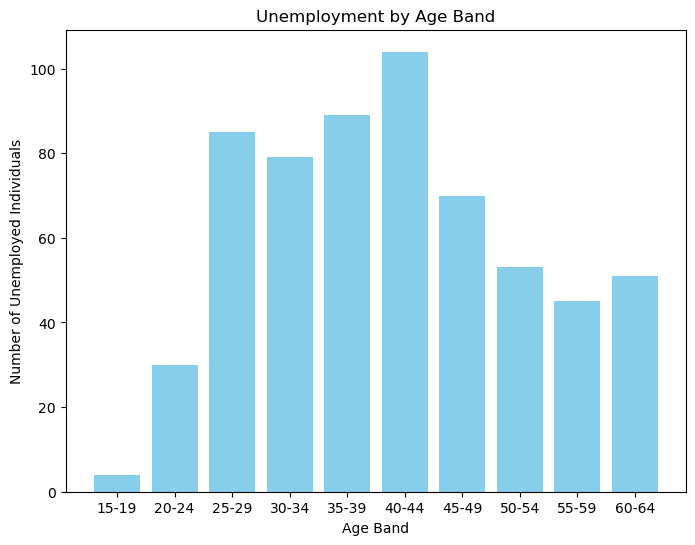

In [306]:
import pandas as pd
import matplotlib.pyplot as plt


# Filter the dataset to include only unemployed individuals
unemployed = census[census['Employment status'] == 'Unemployed']

# Group the data by age band and count the number of unemployed individuals in each age band
unemployed_count = unemployed.groupby('Age Band')['Employment status'].count()

# Create a bar chart to visualize the results
fig, ax = plt.subplots(figsize=(8,6))
ax.bar(unemployed_count.index, unemployed_count.values, color='skyblue')
ax.set_xlabel('Age Band')
ax.set_ylabel('Number of Unemployed Individuals')
ax.set_title('Unemployment by Age Band')
plt.show()


In [ ]:
# individuals between the ages of 40 - 44 are likely to be more unemployed than others

## Religious Affliations 


In [307]:
census.columns

Index(['House Number', 'Street', 'First Name', 'Surname', 'Age',
       'Relationship to Head of House', 'Marital Status', 'Gender',
       'Occupation', 'Infirmity', 'Religion', 'Age Band', 'Address',
       'Household ID', 'Household Occupancy', 'Employment status'],
      dtype='object')

Text(0.5, 1.0, 'Religious Affiliations')

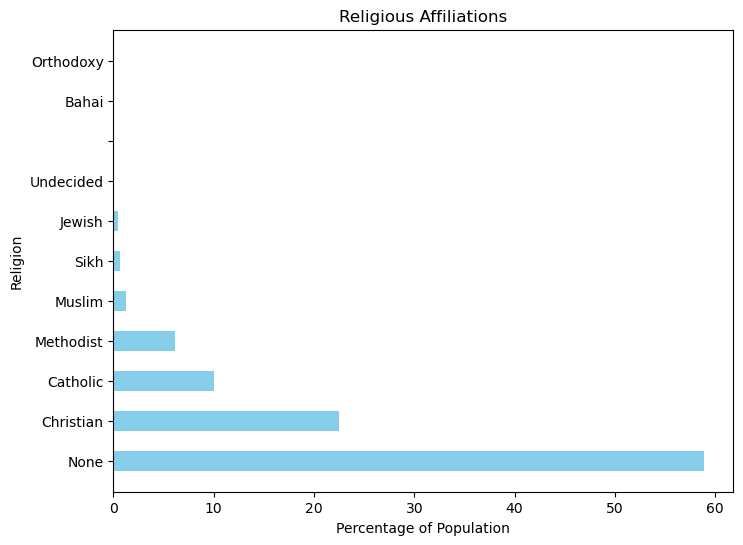

In [308]:
# Group the census data by religion
religion_counts = census.groupby('Religion')['Household ID'].count()

# Calculate the percentage of each religion in the dataset
religion_pct = religion_counts / religion_counts.sum() * 100

# Sort the religions by percentage in descending order
religion_pct = religion_pct.sort_values(ascending=False)

# Plot the religion percentages as a bar chart
fig, ax = plt.subplots(figsize=(8, 6))
ax.barh(religion_pct.index, religion_pct.values, height=0.5, color='skyblue')

# Add labels and title
ax.set_xlabel('Percentage of Population')
ax.set_ylabel('Religion')
ax.set_title('Religious Affiliations')


In [309]:
# The christian religion seems to growing more then the other religions

Divorce and Marriage rate


In [313]:
# Calculate the total number of people for each gender
total_gender = census.groupby('Gender')['Household ID'].nunique()

# Calculate the number of married and divorced people for each gender
married_gender = census[census['Marital Status'] == 'Married'].groupby('Gender')['Household ID'].nunique()
divorced_gender = census[census['Marital Status'] == 'Divorced'].groupby('Gender')['Household ID'].nunique()

# Calculate the marriage and divorce rates for each gender
marriage_rate = married_gender / total_gender * 100
divorce_rate = divorced_gender / total_gender * 100

# Print the results
print("Marriage rate:")
print(marriage_rate)

print("Divorce rate:")
print(divorce_rate)


Marriage rate:
Gender
Female    46.900672
Male      47.552182
Name: Household ID, dtype: float64
Divorce rate:
Gender
Female    18.633308
Male      12.941176
Name: Household ID, dtype: float64


Occupancy level

In [323]:
#The census occupancy level was determined during the cleaning, using the unigue housing IDs that were created 
census['Household Occupancy'].value_counts().sort_values(ascending= False)

5     2270
2     1674
4     1608
3     1443
1      680
6      468
11     264
12     264
8      232
7      224
10     190
9      180
18     108
19      76
21      63
15      60
20      40
14      28
13      26
22      22
17      17
Name: Household Occupancy, dtype: int64

## Commuters


In [327]:
# owing to the fact that it was stated earlier that in this town there is no university, so all the university students are identified as commutters
commuters = census[census['Employment status'] == 'University Student']

In [330]:
commuters.shape


(647, 16)

In [ ]:
# only 647 individuals are commutters and i dont think there other professionals that are commuters


## Birth rate and death rate


In [332]:
census.columns

Index(['House Number', 'Street', 'First Name', 'Surname', 'Age',
       'Relationship to Head of House', 'Marital Status', 'Gender',
       'Occupation', 'Infirmity', 'Religion', 'Age Band', 'Address',
       'Household ID', 'Household Occupancy', 'Employment status'],
      dtype='object')

Unfortunately, birth rate and death rate cannot be directly calculated from the columns available in the census dataset. Typically, birth and death rates are calculated using information from vital statistics, such as birth certificates and death certificates, which contain more specific information about births and deaths in a given population.

However, if the census dataset includes information about the number of children in each household and the number of deaths within a given time period (such as the year in which the census was taken), it may be possible to estimate the birth rate and death rate for the town.

Assuming this information is not available in the dataset, it may be necessary to obtain data from other sources (such as vital statistics records) in order to calculate birth and death rates.